# Notebook du Projet House Price Prediction

# Importation des librairies

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import warnings

from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor

# Importation de la data

In [ ]:
data=pd.read_csv("housing.csv")

#Ajout d'une colonne avec l'ID
data['id'] = range(1, len(data) + 1)

# Exploration de la data

In [ ]:
#On affiche le déubt de notre base de données
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,id
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,1
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,2
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,3
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,4
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,5


In [ ]:
#Nombre de ligne et de colonnes
data.shape

(20640, 11)

In [ ]:
#Détails des caractéristique des variables
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
 10  id                  20640 non-null  int64  
dtypes: float64(9), int64(1), object(1)
memory usage: 1.7+ MB


In [ ]:
#Stat desciptifs
data.describe().T

,count,mean,std,min,25%,50%,75%,max
longitude,20640.0,-119.569704,2.003532,-124.3500,-121.8000,-118.4900,-118.01000,-114.3100
latitude,20640.0,35.631861,2.135952,32.5400,33.9300,34.2600,37.71000,41.9500
housing_median_age,20640.0,28.639486,12.585558,1.0000,18.0000,29.0000,37.00000,52.0000
total_rooms,20640.0,2635.763081,2181.615252,2.0000,1447.7500,2127.0000,3148.00000,39320.0000
total_bedrooms,20433.0,537.870553,421.385070,1.0000,296.0000,435.0000,647.00000,6445.0000
population,20640.0,1425.476744,1132.462122,3.0000,787.0000,1166.0000,1725.00000,35682.0000
households,20640.0,499.539680,382.329753,1.0000,280.0000,409.0000,605.00000,6082.0000
median_income,20640.0,3.870671,1.899822,0.4999,2.5634,3.5348,4.74325,15.0001
median_house_value,20640.0,206855.816909,115395.615874,14999.0000,119600.0000,179700.0000,264725.00000,500001.0000
id,20640.0,10320.500000,5958.399114,1.0000,5160.7500,10320.5000,15480.25000,20640.0000


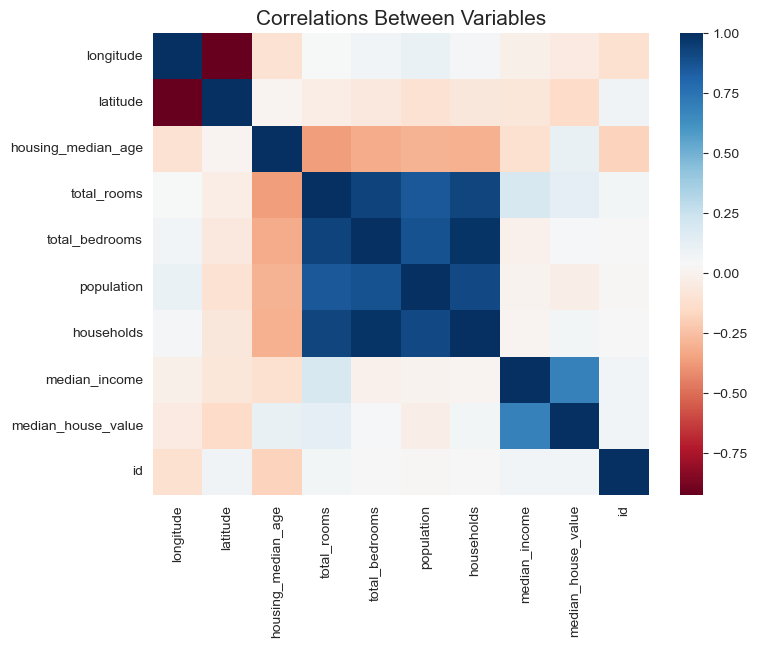

In [ ]:
# Tableau des corélation entre les variables
plt.figure(figsize=(8,6))
sns.heatmap(data.corr(), cmap='RdBu')
plt.title("Correlations Between Variables", size=15)
plt.show()


# Séléction des variables

# Dans cette étape, nous supprimons temporairement les futurs warning et identifions les colonnes numériques importantes en fonction de leur corrélation avec "median_house_value". Nous spécifions également les colonnes catégorielles en tant que cat_cols ainsi que l'index

In [ ]:
# Ignorer les avertissements concernant les fonctionnalités qui seront modifiées dans le futur
warnings.filterwarnings("ignore", category=FutureWarning)

# Identification des colonnes numériques qui ont une forte corrélation avec la valeur médiane des maisons.
# Corrélation forte signifie ici supérieure à 0.5 ou inférieure à -0.5.
important_num_cols = list(data.corr(method='pearson')['median_house_value']
                          [(data.corr(method='pearson')['median_house_value'] > 0.50) |
                           (data.corr(method='pearson')['median_house_value'] < -0.50)].index)



# Réinitialiser les avertissements à leur comportement par défaut.
warnings.resetwarnings()

# Liste des colonnes catégorielles
cat_cols = ['ocean_proximity']

#Liste de colonne pour l'ID
index = ['id']

# Combiner les colonnes numériques importantes avec les colonnes catégorielles
#Pas encore l'index pour pas qu'il intervient dans nos stats par la suite
important_cols = important_num_cols + cat_cols



In [ ]:
# Nouveau DataFrame contenant uniquement les colonnes importantes
important_data = data[important_cols].copy()

# Afficher le nombre de valeurs manquantes pour chaque colonne
print("Valeurs manquantes par colonnes ")
print("-" * 30)  # Une ligne de séparation pour améliorer la lisibilité
print(important_data.isna().sum())  # Somme des valeurs NaN pour chaque colonne
print("-" * 30)

# Calcule et afficher le nombre total de valeurs manquantes dans le DataFrame
print("TOTAL VALUERS MANQUANTES", important_data.isna().sum().sum())


Valeurs manquantes par colonnes 
------------------------------
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64
------------------------------
TOTAL VALUERS MANQUANTES 0


# Data Visualization

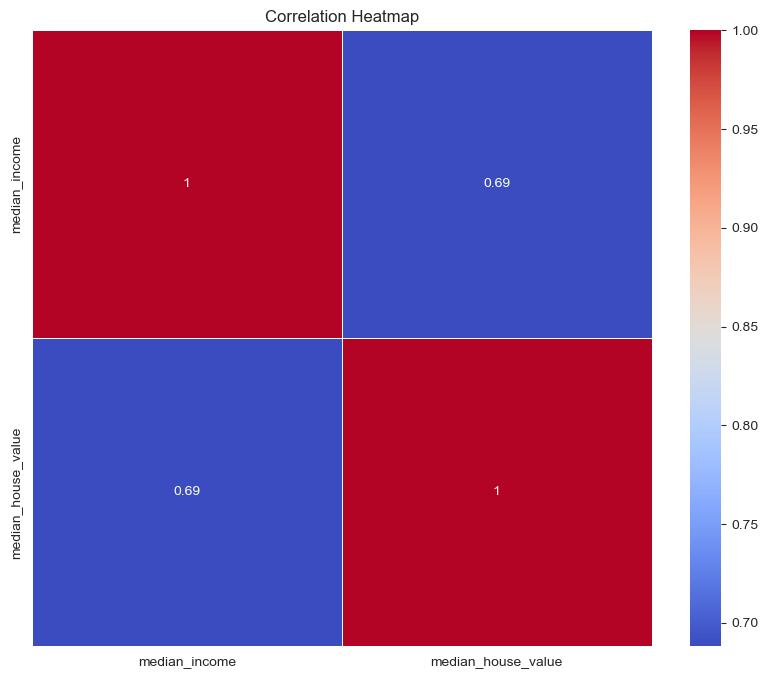

In [ ]:
# Matrice de corrélation
correlation_matrix = data[important_num_cols].corr()

# Visualisation
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

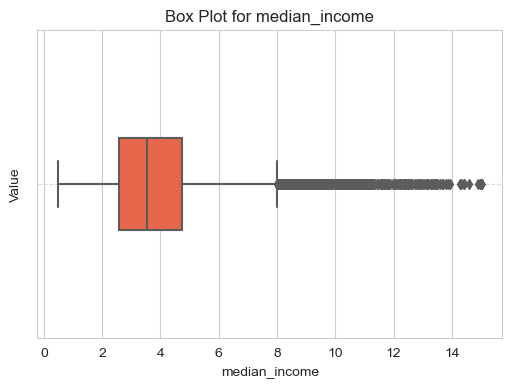

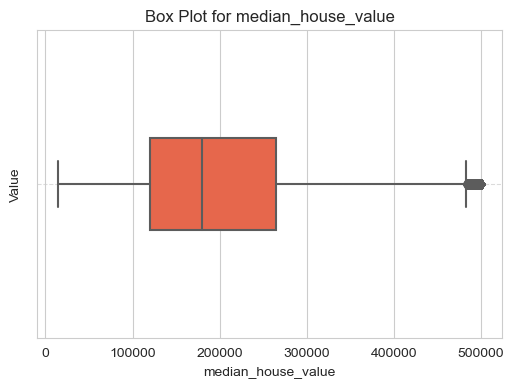

In [ ]:
# Création des box plot
for col in important_num_cols:
    plt.figure(figsize=(6, 4))  # Smaller figure size

    # Couleurs
    custom_palette = ["#FF5733", "#33FF7A", "#337AFF", "#FF33E6", "#FFCC33"]

    sns.boxplot(x=col, data=data, palette=custom_palette, width=0.3)

    # Titres
    plt.title(f'Box Plot for {col}')
    plt.xlabel(col)
    plt.ylabel('Value')

    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.show()

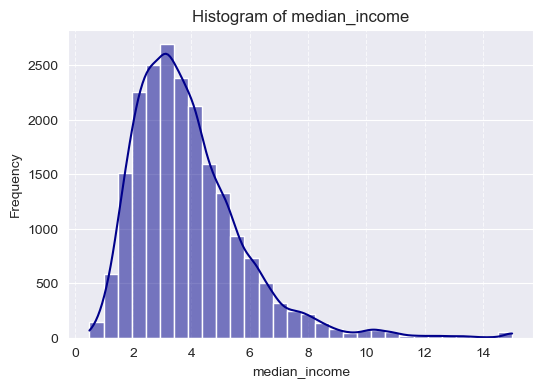

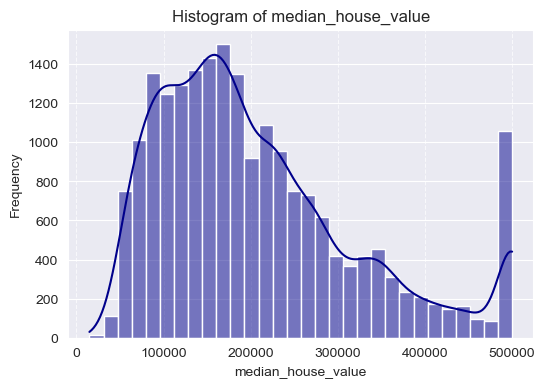

In [ ]:
# Creation d'histogrammes
for col in important_num_cols:
    plt.figure(figsize=(6, 4))

    sns.set_style("darkgrid")
    ax = sns.histplot(data[col], bins=30, kde=True, color='darkblue')

    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {col}')

    ax.xaxis.grid(True, linestyle='--', alpha=0.7)

    plt.show()

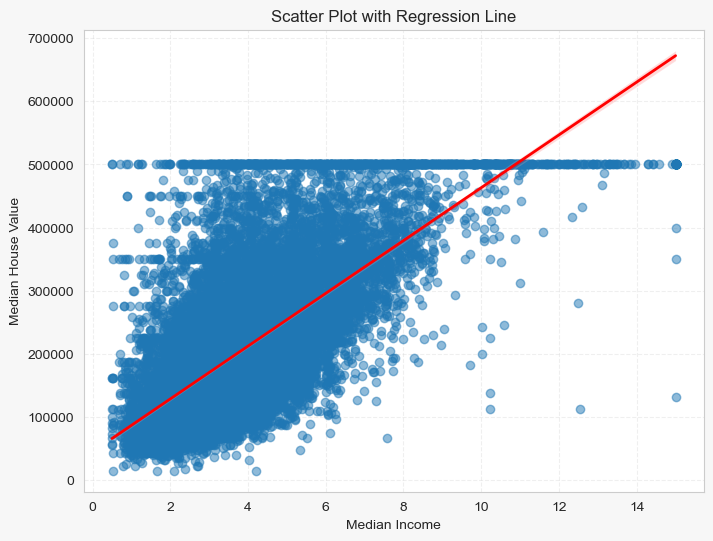

In [ ]:
# Regression
plt.figure(figsize=(8, 6))
sns.set_style("whitegrid")
sns.regplot(x=data["median_income"], y=data["median_house_value"], scatter_kws={'alpha': 0.5}, line_kws={"color": "red", "linewidth": 2})
plt.title('Scatter Plot with Regression Line')

plt.xlabel('Median Income')
plt.ylabel('Median House Value')

plt.grid(axis='both', linestyle='--', alpha=0.3)

fig = plt.gcf()
fig.set_facecolor('#f7f7f7')

plt.show()

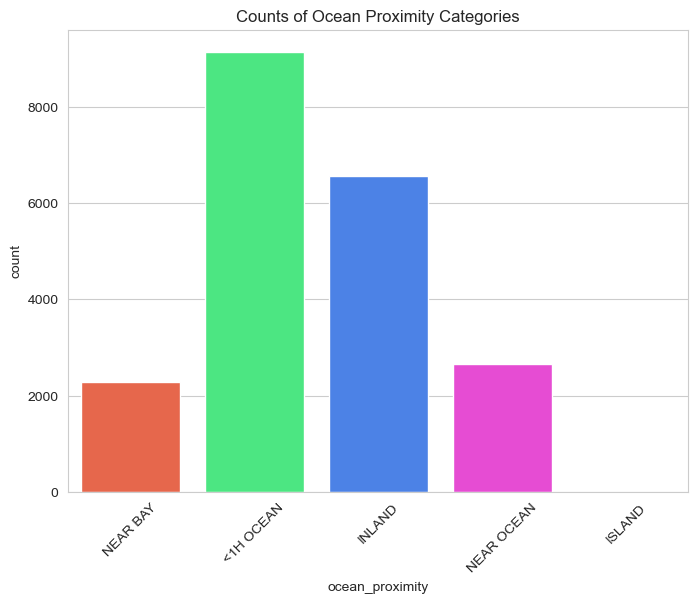

In [ ]:

custom_palette = ["#FF5733", "#33FF7A", "#337AFF", "#FF33E6", "#FFCC33"]

# Create a bar plot for 'ocean_proximity' with the custom color palette
plt.figure(figsize=(8, 6))
sns.countplot(x='ocean_proximity', data=data, palette=custom_palette)
plt.title('Counts of Ocean Proximity Categories')
plt.xticks(rotation=45)
plt.show()

#Each category will have a corresponding bar in the plot, and the height of the bar represents the number of data points associated with that category.


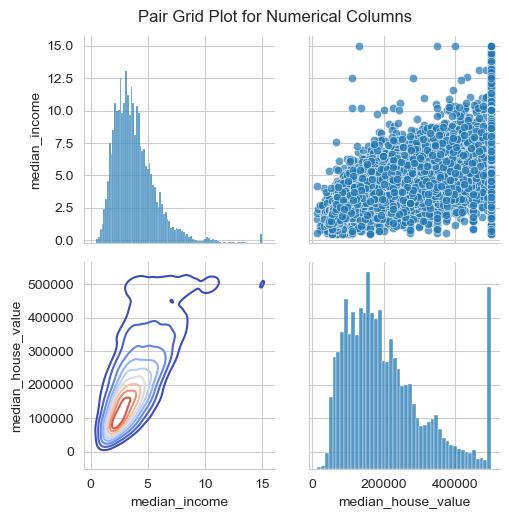

In [ ]:
# Create a custom color palette with visually appealing colors
custom_palette = ["#FF5733", "#33FF7A", "#337AFF", "#FF33E6", "#FFCC33"]

# Create a Pair Grid plot with custom color palette and added style
g = sns.PairGrid(data[important_num_cols], palette=custom_palette)
g.map_upper(sns.scatterplot, alpha=0.7)
g.map_lower(sns.kdeplot, cmap="coolwarm")
g.map_diag(sns.histplot, kde_kws={'color': 'purple'})

# Add titles and labels
g.fig.suptitle("Pair Grid Plot for Numerical Columns", y=1.02)
plt.show()

# Data Preparation

# Ici on définit nos varibles x et y pour le modele

In [ ]:
important_cols = important_num_cols + cat_cols +index
important_data = data[important_cols].copy()

x=important_data.drop('median_house_value',axis=1)
y=important_data['median_house_value']

x = pd.get_dummies(x, columns=cat_cols)

important_num_cols.remove('median_house_value')
scaler= StandardScaler()
x[important_num_cols]=scaler.fit_transform(x[important_num_cols])

In [ ]:
x.head()

,median_income,id,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,2.344766,1,0,0,0,1,0
1,2.332238,2,0,0,0,1,0
2,1.782699,3,0,0,0,1,0
3,0.932968,4,0,0,0,1,0
4,-0.012881,5,0,0,0,1,0


# Séparation Train-Test

# On définit notre data test et notre data train

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2, random_state=42)

In [ ]:
x_test.head()

,median_income,id,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
20046,-1.152489,20047,0,1,0,0,0
3024,-0.705015,3025,0,1,0,0,0
15663,-0.205588,15664,0,0,0,1,0
20484,0.982710,20485,1,0,0,0,0
9814,-0.076678,9815,0,0,0,0,1


In [ ]:
# On creer une nouvelle data pour garder l'ID des obs de X_test
new_data = x_test[['id']].copy()

# On retire la colonne 'ID de x_test
x_test.drop(columns='id', inplace=True)

# On retire la colonne ID de x_train
x_train = x_train.drop('id', axis=1)


In [ ]:
#calcule la racine carrée de l'erreur quadratique moyenne (RMSE) en utilisant la validation croisée
def rmse_cv(model,x,y):
    rmse = np.sqrt(-cross_val_score(model, x, y, scoring="neg_mean_squared_error", cv=5))
    return rmse.mean()

In [ ]:
#On évalue les performances du modèle de prédiction
def evaluation(y, predictions):
    mae = mean_absolute_error(y, predictions)
    mse = mean_squared_error(y, predictions)
    rmse = np.sqrt(mse)
    r_squared = r2_score(y, predictions)
    return mae, mse, rmse, r_squared

In [ ]:
models = pd.DataFrame(columns=["Model", "MAE", "MSE", "RMSE", "R2 SCORE", "RMSE (Cross-Validation)"])

In [ ]:
print("x_train columns:", x_train.columns)
print("x_test columns:", x_test.columns)


x_train columns: Index(['median_income', 'ocean_proximity_<1H OCEAN', 'ocean_proximity_INLAND',
       'ocean_proximity_ISLAND', 'ocean_proximity_NEAR BAY',
       'ocean_proximity_NEAR OCEAN'],
      dtype='object')
x_test columns: Index(['median_income', 'ocean_proximity_<1H OCEAN', 'ocean_proximity_INLAND',
       'ocean_proximity_ISLAND', 'ocean_proximity_NEAR BAY',
       'ocean_proximity_NEAR OCEAN'],
      dtype='object')


# LİNEAR REGRESSİON

In [ ]:
linear_reg = LinearRegression()
linear_reg.fit(x_train, y_train)
predictions = linear_reg.predict(x_test)

mae, mse, rmse, r_squared = evaluation(y_test, predictions)
print("MAE", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R2_Score", r_squared)
print("-" * 30)
print("prediction: ", predictions)


#RMSE avec validation croisée
rmse_cross_val = rmse_cv(linear_reg, x_train, y_train)
print("RMSE Cross-Validation", rmse_cross_val)

new_row = {"Model": "LinearRegression", "MAE": mae, "MSE": mse, "RMSE": rmse, "R2 SCORE": r_squared, "RMSE (Cross-Validation)": rmse_cross_val}
models = pd.concat([models, pd.DataFrame([new_row])], ignore_index=True)



# Ajout d'une nouvelle colonne à new_data
new_data['Linear Regression Prediction'] = predictions

# Affichage du nouveau DataFrame
print(new_data)




MAE 53531.53518489236
MSE: 5560400062.939725
RMSE: 74568.09011192204
R2_Score 0.5756744531463729
------------------------------
prediction:  [ 67566.0848907   99221.18446676 232980.9907694  ... 426635.89645463
 108668.18924555 215215.87661812]
RMSE Cross-Validation 73967.09509916222
          id  Linear Regression Prediction
20046  20047                  67566.084891
3024    3025                  99221.184467
15663  15664                 232980.990769
20484  20485                 296597.149555
9814    9815                 238182.970157
...      ...                           ...
15362  15363                 254422.622111
16623  16624                 201005.636412
18086  18087                 426635.896455
2144    2145                 108668.189246
3665    3666                 215215.876618

[4128 rows x 2 columns]


/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

# RİDGE REGRESSİON

In [ ]:
ridge=Ridge()
ridge.fit(x_train,y_train)
predictions=ridge.predict(x_test)

#x_test["ridge regression prediction"] = predictions

mae, mse, rmse, r_squared = evaluation(y_test, predictions)
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R2 Score:", r_squared)
print("-"*30)
rmse_cross_val = rmse_cv(ridge,x_train,y_train)
print("RMSE Cross-Validation:", rmse_cross_val)

new_row = {"Model": "Ridge","MAE": mae, "MSE": mse, "RMSE": rmse, "R2 SCORE": r_squared, "RMSE (Cross-Validation)": rmse_cross_val}
models = pd.concat([models, pd.DataFrame([new_row])], ignore_index=True)

import pandas as pd

# Création d'un nouveau DataFrame avec une colonne pour les prédictions
new_data['Ridge Regression Prediction'] = predictions

# Affichage du nouveau DataFrame
print(new_data)


MAE: 53540.52996910387
MSE: 5561917370.704368
RMSE: 74578.26339292413
R2 Score: 0.5755586642751246
------------------------------
RMSE Cross-Validation: 73967.63145038897
          id  Linear Regression Prediction  Ridge Regression Prediction
20046  20047                  67566.084891                 67591.061993
3024    3025                  99221.184467                 99242.850713
15663  15664                 232980.990769                232984.158325
20484  20485                 296597.149555                296594.167018
9814    9815                 238182.970157                238186.188737
...      ...                           ...                          ...
15362  15363                 254422.622111                254424.050675
16623  16624                 201005.636412                201012.743428
18086  18087                 426635.896455                426619.312960
2144    2145                 108668.189246                108688.867414
3665    3666                 215215.8

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

# ELASTİC NET REGRESSİON

In [ ]:
elastic_net=ElasticNet()
elastic_net.fit(x_train,y_train)
predictions=elastic_net.predict(x_test)

mae, mse, rmse, r_squared = evaluation(y_test, predictions)
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R2 Score:", r_squared)
print("-"*30)
rmse_cross_val = rmse_cv(elastic_net,x_train,y_train)
print("RMSE Cross-Validation:", rmse_cross_val)

new_row = {"Model": "ElasticNet","MAE": mae, "MSE": mse, "RMSE": rmse, "R2 SCORE": r_squared, "RMSE (Cross-Validation)": rmse_cross_val}

models = pd.concat([models, pd.DataFrame([new_row])], ignore_index=True)

# Création d'un nouveau DataFrame avec une colonne pour les prédictions
new_data['Elastic Net Regression Prediction'] = predictions

# Affichage du nouveau DataFrame
print(new_data)

MAE: 62027.90245447717
MSE: 6700580116.281014
RMSE: 81857.07126620776
R2 Score: 0.4886649719634927
------------------------------
RMSE Cross-Validation: 81761.24925874284
          id  Linear Regression Prediction  Ridge Regression Prediction  \
20046  20047                  67566.084891                 67591.061993   
3024    3025                  99221.184467                 99242.850713   
15663  15664                 232980.990769                232984.158325   
20484  20485                 296597.149555                296594.167018   
9814    9815                 238182.970157                238186.188737   
...      ...                           ...                          ...   
15362  15363                 254422.622111                254424.050675   
16623  16624                 201005.636412                201012.743428   
18086  18087                 426635.896455                426619.312960   
2144    2145                 108668.189246                108688.867414   
3665

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

# KNN (K-Nearest Neighbors)

In [ ]:
knn=KNeighborsRegressor(n_neighbors=5)
knn.fit(x_train,y_train)

predictions=knn.predict(x_test)

mae, mse, rmse, r_squared = evaluation(y_test, predictions)
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R2 Score:", r_squared)
print("-" * 30)

rmse_cross_val = rmse_cv(knn, x_train, y_train)
print("RMSE Cross-Validation:", rmse_cross_val)

new_row = {"Model": "K-Nearest Neighbors", "MAE": mae, "MSE": mse, "RMSE": rmse, "R2 SCORE": r_squared, "RMSE (Cross-Validation)": rmse_cross_val}
models = pd.concat([models, pd.DataFrame([new_row])], ignore_index=True)

# Création d'un nouveau DataFrame avec une colonne pour les prédictions
new_data['KNN Prediction'] = predictions

# Affichage du nouveau DataFrame
print(new_data)

MAE: 56713.22078488372
MSE: 6246027408.817568
RMSE: 79031.81263780787
R2 Score: 0.5233528224751429
------------------------------
RMSE Cross-Validation: 78782.66967733807
          id  Linear Regression Prediction  Ridge Regression Prediction  \
20046  20047                  67566.084891                 67591.061993   
3024    3025                  99221.184467                 99242.850713   
15663  15664                 232980.990769                232984.158325   
20484  20485                 296597.149555                296594.167018   
9814    9815                 238182.970157                238186.188737   
...      ...                           ...                          ...   
15362  15363                 254422.622111                254424.050675   
16623  16624                 201005.636412                201012.743428   
18086  18087                 426635.896455                426619.312960   
2144    2145                 108668.189246                108688.867414   
3665

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

# Support Vector Machines

In [ ]:
svr=SVR(C=100000)
svr.fit(x_train,y_train)
predictions=svr.predict(x_test)

mae, mse, rmse, r_squared = evaluation(y_test, predictions)
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R2 Score:", r_squared)
print("-"*30)
rmse_cross_val = rmse_cv(svr,x_train,y_train)
print("RMSE Cross-Validation:", rmse_cross_val)

new_row = {"Model": "SVR","MAE": mae, "MSE": mse, "RMSE": rmse, "R2 SCORE": r_squared, "RMSE (Cross-Validation)": rmse_cross_val}

models = pd.concat([models, pd.DataFrame([new_row])], ignore_index=True)

# Création d'un nouveau DataFrame avec une colonne pour les prédictions
new_data['SVM Prediction'] = predictions

# Affichage du nouveau DataFrame
print(new_data)

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


MAE: 50179.333059712866
MSE: 5672830798.849114
RMSE: 75318.19699680227
R2 Score: 0.5670946328172786
------------------------------


/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

RMSE Cross-Validation: 74237.34063618144
          id  Linear Regression Prediction  Ridge Regression Prediction  \
20046  20047                  67566.084891                 67591.061993   
3024    3025                  99221.184467                 99242.850713   
15663  15664                 232980.990769                232984.158325   
20484  20485                 296597.149555                296594.167018   
9814    9815                 238182.970157                238186.188737   
...      ...                           ...                          ...   
15362  15363                 254422.622111                254424.050675   
16623  16624                 201005.636412                201012.743428   
18086  18087                 426635.896455                426619.312960   
2144    2145                 108668.189246                108688.867414   
3665    3666                 215215.876618                215221.405877   

       Elastic Net Regression Prediction  KNN Prediction  

# Decision Tree

In [ ]:
decision_tree=DecisionTreeRegressor()
decision_tree.fit(x_train,y_train)

predictions=decision_tree.predict(x_test)

mae, mse, rmse, r_squared = evaluation(y_test, predictions)
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R2 Score:", r_squared)
print("-" * 30)

rmse_cross_val=rmse_cv(decision_tree,x_train,y_train)
print("RMSE Cross-Validation:", rmse_cross_val)

new_row = {"Model": "Decision Tree", "MAE": mae, "MSE": mse, "RMSE": rmse, "R2 SCORE": r_squared, "RMSE (Cross-Validation)": rmse_cross_val}
models = pd.concat([models, pd.DataFrame([new_row])], ignore_index=True)

# Création d'un nouveau DataFrame avec une colonne pour les prédictions
new_data['Decision Tree Prediction'] = predictions

# Affichage du nouveau DataFrame
print(new_data)

MAE: 68807.98656465573
MSE: 9709445015.476877
RMSE: 98536.51615252529
R2 Score: 0.25905231292669495
------------------------------
RMSE Cross-Validation: 98654.34781168625
          id  Linear Regression Prediction  Ridge Regression Prediction  \
20046  20047                  67566.084891                 67591.061993   
3024    3025                  99221.184467                 99242.850713   
15663  15664                 232980.990769                232984.158325   
20484  20485                 296597.149555                296594.167018   
9814    9815                 238182.970157                238186.188737   
...      ...                           ...                          ...   
15362  15363                 254422.622111                254424.050675   
16623  16624                 201005.636412                201012.743428   
18086  18087                 426635.896455                426619.312960   
2144    2145                 108668.189246                108688.867414   
366

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

# Random Forest

In [ ]:
random_forest=RandomForestRegressor(n_estimators=100)
random_forest.fit(x_train,y_train)
predictions=random_forest.predict(x_test)

mae, mse, rmse, r_squared = evaluation(y_test, predictions)
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R2 Score:", r_squared)
print("-"*30)
rmse_cross_val = rmse_cv(random_forest,x_train,y_train)
print("RMSE Cross-Validation:", rmse_cross_val)

new_row = {"Model": "RandomForestRegressor","MAE": mae, "MSE": mse, "RMSE": rmse, "R2 SCORE": r_squared, "RMSE (Cross-Validation)": rmse_cross_val}
models = pd.concat([models, pd.DataFrame([new_row])], ignore_index=True)

# Création d'un nouveau DataFrame avec une colonne pour les prédictions
new_data['Random Forest Prediction'] = predictions

# Affichage du nouveau DataFrame
print(new_data)

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

MAE: 60116.86954089987
MSE: 7232359668.582154
RMSE: 85043.28114896646
R2 Score: 0.4480837823401581
------------------------------


/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

RMSE Cross-Validation: 85158.11666223845
          id  Linear Regression Prediction  Ridge Regression Prediction  \
20046  20047                  67566.084891                 67591.061993   
3024    3025                  99221.184467                 99242.850713   
15663  15664                 232980.990769                232984.158325   
20484  20485                 296597.149555                296594.167018   
9814    9815                 238182.970157                238186.188737   
...      ...                           ...                          ...   
15362  15363                 254422.622111                254424.050675   
16623  16624                 201005.636412                201012.743428   
18086  18087                 426635.896455                426619.312960   
2144    2145                 108668.189246                108688.867414   
3665    3666                 215215.876618                215221.405877   

       Elastic Net Regression Prediction  KNN Prediction  

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


# Gradient Boosting

In [ ]:
gradient_boost=GradientBoostingRegressor(n_estimators=100,learning_rate=0.1,max_depth=3,random_state=42)
gradient_boost.fit(x_train,y_train)

predictions=gradient_boost.predict(x_test)

mae, mse, rmse, r_squared = evaluation(y_test, predictions)
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R2 Score:", r_squared)
print("-" * 30)

rmse_cross_val = rmse_cv(gradient_boost, x_train, y_train)
print("RMSE Cross-Validation:", rmse_cross_val)

new_row = {"Model": "Gradient Boosting", "MAE": mae, "MSE": mse, "RMSE": rmse, "R2 SCORE": r_squared, "RMSE (Cross-Validation)": rmse_cross_val}
models = pd.concat([models, pd.DataFrame([new_row])], ignore_index=True)

# Création d'un nouveau DataFrame avec une colonne pour les prédictions
new_data['Gradient Boosting Prediction'] = predictions

# Affichage du nouveau DataFrame
print(new_data)

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

MAE: 52013.846982703566
MSE: 5379581393.265998
RMSE: 73345.62968075192
R2 Score: 0.5894730971328068
------------------------------


/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

RMSE Cross-Validation: 72351.87892260542
          id  Linear Regression Prediction  Ridge Regression Prediction  \
20046  20047                  67566.084891                 67591.061993   
3024    3025                  99221.184467                 99242.850713   
15663  15664                 232980.990769                232984.158325   
20484  20485                 296597.149555                296594.167018   
9814    9815                 238182.970157                238186.188737   
...      ...                           ...                          ...   
15362  15363                 254422.622111                254424.050675   
16623  16624                 201005.636412                201012.743428   
18086  18087                 426635.896455                426619.312960   
2144    2145                 108668.189246                108688.867414   
3665    3666                 215215.876618                215221.405877   

       Elastic Net Regression Prediction  KNN Prediction  

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


# XGBoost

In [ ]:
x_train.columns = [col.replace('<', '__').replace('[', '__').replace(']', '__') for col in x_train.columns]
x_test.columns = [col.replace('<', '__').replace('[', '__').replace(']', '__') for col in x_test.columns]
xgb = XGBRegressor(n_estimators=100, learning_rate=0.01)
xgb.fit(x_train, y_train)

predictions = xgb.predict(x_test)

mae, mse, rmse, r_squared = evaluation(y_test, predictions)
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R2 Score:", r_squared)
print("-" * 30)

#RMSE avec validation croisée
rmse_cross_val = cross_val_score(xgb, x_train, y_train, cv=5, scoring='neg_root_mean_squared_error')
rmse_cross_val = -rmse_cross_val[0]
print("RMSE Cross-Validation:", rmse_cross_val)

new_row = {"Model": "XGBRegressor", "MAE": mae, "MSE": mse, "RMSE": rmse, "R2 SCORE": r_squared, "RMSE (Cross-Validation)": rmse_cross_val}

models = pd.concat([models, pd.DataFrame([new_row])], ignore_index=True)

# Création d'un nouveau DataFrame avec une colonne pour les prédictions
new_data['XGBoost Prediction'] = predictions

# Affichage du nouveau DataFrame
print(new_data)

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


MAE: 60265.80001097686
MSE: 6357805837.412428
RMSE: 79735.8503899747
R2 Score: 0.5148227810567063
------------------------------


/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

RMSE Cross-Validation: 81006.68161893639
          id  Linear Regression Prediction  Ridge Regression Prediction  \
20046  20047                  67566.084891                 67591.061993   
3024    3025                  99221.184467                 99242.850713   
15663  15664                 232980.990769                232984.158325   
20484  20485                 296597.149555                296594.167018   
9814    9815                 238182.970157                238186.188737   
...      ...                           ...                          ...   
15362  15363                 254422.622111                254424.050675   
16623  16624                 201005.636412                201012.743428   
18086  18087                 426635.896455                426619.312960   
2144    2145                 108668.189246                108688.867414   
3665    3666                 215215.876618                215221.405877   

       Elastic Net Regression Prediction  KNN Prediction  

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


# Artificial Neural Network MLP

In [ ]:
ann=MLPRegressor(hidden_layer_sizes=(100,50),activation='relu',solver='adam',max_iter=1000,random_state=42)
ann.fit(x_train,y_train)

predictions=ann.predict(x_test)

mae, mse, rmse, r_squared = evaluation(y_test, predictions)
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R2 Score:", r_squared)
print("-" * 30)

rmse_cross_val = rmse_cv(ann, x_train, y_train)
print("RMSE Cross-Validation:", rmse_cross_val)

new_row = {"Model": "Artificial Neural Network", "MAE": mae, "MSE": mse, "RMSE": rmse, "R2 SCORE": r_squared, "RMSE (Cross-Validation)": rmse_cross_val}
models = pd.concat([models, pd.DataFrame([new_row])], ignore_index=True)

# Création d'un nouveau DataFrame avec une colonne pour les prédictions
new_data['Artificial Neural Network Prediction'] = predictions

# Affichage du nouveau DataFrame
print(new_data)

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

MAE: 53388.36109110975
MSE: 5539401087.233097
RMSE: 74427.15288947373
R2 Score: 0.5772769281030705
------------------------------


/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

RMSE Cross-Validation: 73846.40514800364
          id  Linear Regression Prediction  Ridge Regression Prediction  \
20046  20047                  67566.084891                 67591.061993   
3024    3025                  99221.184467                 99242.850713   
15663  15664                 232980.990769                232984.158325   
20484  20485                 296597.149555                296594.167018   
9814    9815                 238182.970157                238186.188737   
...      ...                           ...                          ...   
15362  15363                 254422.622111                254424.050675   
16623  16624                 201005.636412                201012.743428   
18086  18087                 426635.896455                426619.312960   
2144    2145                 108668.189246                108688.867414   
3665    3666                 215215.876618                215221.405877   

       Elastic Net Regression Prediction  KNN Prediction  

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


# Polynomial Regression (Degree=2)

In [ ]:
poly_reg = PolynomialFeatures(degree=2)
X_train_2d = poly_reg.fit_transform(x_train)
X_test_2d = poly_reg.transform(x_test)

lin_reg = LinearRegression()
lin_reg.fit(X_train_2d, y_train)
predictions = lin_reg.predict(X_test_2d)

mae, mse, rmse, r_squared = evaluation(y_test, predictions)
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R2 Score:", r_squared)
print("-" * 30)
rmse_cross_val = rmse_cv(lin_reg, X_train_2d, y_train)
print("RMSE Cross-Validation:", rmse_cross_val)


new_row = {"Model": "Polynomial Regression (degree=2)", "MAE": mae, "MSE": mse, "RMSE": rmse, "R2 SCORE": r_squared, "RMSE (Cross-Validation)": rmse_cross_val}
models = pd.concat([models, pd.DataFrame([new_row])], ignore_index=True)

# Création d'un nouveau DataFrame avec une colonne pour les prédictions
new_data['Polynomial Regression Prediction'] = predictions

# Affichage du nouveau DataFrame
print(new_data)

MAE: 53347.8714874031
MSE: 5512060432.4113
RMSE: 74243.25176345187
R2 Score: 0.5793633496154216
------------------------------
RMSE Cross-Validation: 73578.0583504994
          id  Linear Regression Prediction  Ridge Regression Prediction  \
20046  20047                  67566.084891                 67591.061993   
3024    3025                  99221.184467                 99242.850713   
15663  15664                 232980.990769                232984.158325   
20484  20485                 296597.149555                296594.167018   
9814    9815                 238182.970157                238186.188737   
...      ...                           ...                          ...   
15362  15363                 254422.622111                254424.050675   
16623  16624                 201005.636412                201012.743428   
18086  18087                 426635.896455                426619.312960   
2144    2145                 108668.189246                108688.867414   
3665    

/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Depr

# Model Comparison

# Plus l'erreur quadratique moyenne est faible, meilleur est le modèle.

In [ ]:
models

,Model,MAE,MSE,RMSE,R2 SCORE,RMSE (Cross-Validation)
0,LinearRegression,53531.535185,5.560400e+09,74568.090112,0.575674,73967.095099
1,Ridge,53540.529969,5.561917e+09,74578.263393,0.575559,73967.631450
2,ElasticNet,62027.902454,6.700580e+09,81857.071266,0.488665,81761.249259
3,K-Nearest Neighbors,56713.220785,6.246027e+09,79031.812638,0.523353,78782.669677
4,SVR,50179.333060,5.672831e+09,75318.196997,0.567095,74237.340636
5,Decision Tree,68807.986565,9.709445e+09,98536.516153,0.259052,98654.347812
6,RandomForestRegressor,60116.869541,7.232360e+09,85043.281149,0.448084,85158.116662
7,Gradient Boosting,52013.846983,5.379581e+09,73345.629681,0.589473,72351.878923
8,XGBRegressor,60265.800011,6.357806e+09,79735.850390,0.514823,81006.681619
9,Artificial Neural Network,53388.361091,5.539401e+09,74427.152889,0.577277,73846.405148


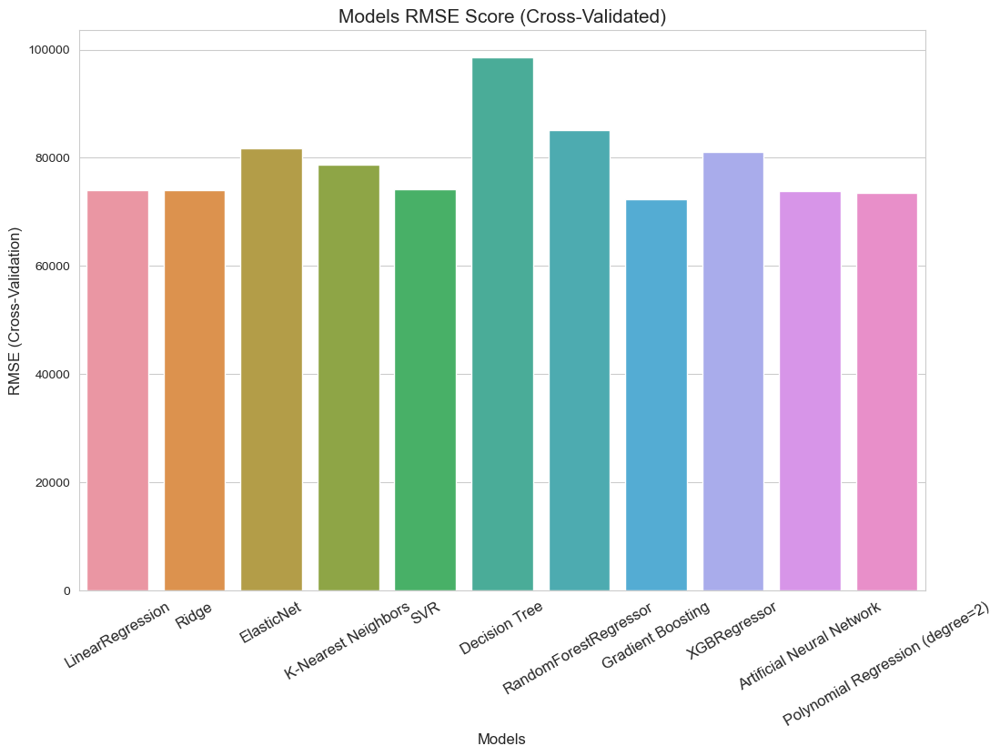

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(x=models['Model'], y=models['RMSE (Cross-Validation)'])
plt.title("Models RMSE Score (Cross-Validated)", size=15)
plt.xticks(rotation=30, size=12)
plt.xlabel("Models", size=12)
plt.ylabel("RMSE (Cross-Validation)", size=12)

plt.show()

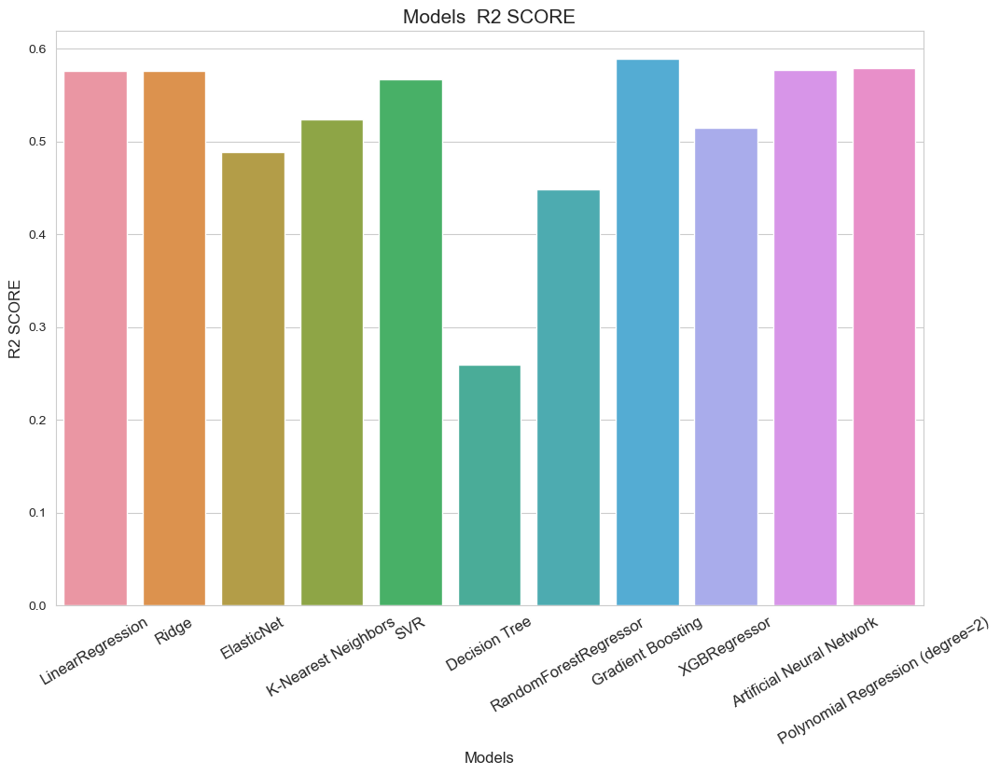

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(x=models['Model'], y=models['R2 SCORE'])
plt.title("Models  R2 SCORE", size=15)
plt.xticks(rotation=30, size=12)
plt.xlabel("Models", size=12)
plt.ylabel("R2 SCORE", size=12)

plt.show()

In [ ]:
new_data.head()

,id,Linear Regression Prediction,Ridge Regression Prediction,Elastic Net Regression Prediction,KNN Prediction,SVM Prediction,Decision Tree Prediction,Random Forest Prediction,Gradient Boosting Prediction,XGBoost Prediction,Artificial Neural Network Prediction,Polynomial Regression Prediction
20046,20047,67566.084891,67591.061993,124544.961880,84580.0,66930.434239,69400.0,73228.666667,76735.724353,124051.523438,79190.907061,69842.4375
3024,3025,99221.184467,99242.850713,147197.706329,114940.0,92427.319691,111900.0,108986.916667,103505.034110,141430.484375,101608.429192,101682.4375
15663,15664,232980.990769,232984.158325,205967.769134,205980.0,212885.033521,191400.0,200223.000000,237126.221502,230087.437500,232390.985970,233176.4375
20484,20485,296597.149555,296594.167018,268850.866983,311000.0,272935.126041,497600.0,422590.010000,294771.258966,260550.812500,298226.956383,301075.1875
9814,9815,238182.970157,238186.188737,212024.141514,254240.2,231366.040637,123500.0,167437.580000,238374.458522,226879.796875,238300.775631,239248.1875


In [ ]:
#On récupere les variables par l'ID
new_data = new_data.merge(data[['id', 'latitude', 'longitude', 'median_house_value']], on='id', how='left')


In [ ]:
new_data.head()

,id,Linear Regression Prediction,Ridge Regression Prediction,Elastic Net Regression Prediction,KNN Prediction,SVM Prediction,Decision Tree Prediction,Random Forest Prediction,Gradient Boosting Prediction,XGBoost Prediction,Artificial Neural Network Prediction,Polynomial Regression Prediction,latitude,longitude,median_house_value
0,20047,67566.084891,67591.061993,124544.961880,84580.0,66930.434239,69400.0,73228.666667,76735.724353,124051.523438,79190.907061,69842.4375,36.06,-119.01,47700.0
1,3025,99221.184467,99242.850713,147197.706329,114940.0,92427.319691,111900.0,108986.916667,103505.034110,141430.484375,101608.429192,101682.4375,35.14,-119.46,45800.0
2,15664,232980.990769,232984.158325,205967.769134,205980.0,212885.033521,191400.0,200223.000000,237126.221502,230087.437500,232390.985970,233176.4375,37.80,-122.44,500001.0
3,20485,296597.149555,296594.167018,268850.866983,311000.0,272935.126041,497600.0,422590.010000,294771.258966,260550.812500,298226.956383,301075.1875,34.28,-118.72,218600.0
4,9815,238182.970157,238186.188737,212024.141514,254240.2,231366.040637,123500.0,167437.580000,238374.458522,226879.796875,238300.775631,239248.1875,36.62,-121.93,278000.0


In [ ]:
#  une liste des colonnes de prédiction
prediction_columns = [
    'Linear Regression Prediction', 'Ridge Regression Prediction',
    'Elastic Net Regression Prediction', 'KNN Prediction', 'SVM Prediction',
    'Decision Tree Prediction', 'Random Forest Prediction',
    'Gradient Boosting Prediction', 'XGBoost Prediction',
    'Artificial Neural Network Prediction', 'Polynomial Regression Prediction'
]

# Pour chaque appartement, on calcule la différence absolue entre les prédictions et la valeur réelle
new_data['Best Model'] = new_data[prediction_columns].sub(
    new_data['median_house_value'], axis=0).abs().idxmin(axis=1)

# La colonne 'Best Model' dans new_data indique maintenant quel modèle a fait la prédiction la plus proche


In [ ]:
new_data.head()

,id,Linear Regression Prediction,Ridge Regression Prediction,Elastic Net Regression Prediction,KNN Prediction,SVM Prediction,Decision Tree Prediction,Random Forest Prediction,Gradient Boosting Prediction,XGBoost Prediction,Artificial Neural Network Prediction,Polynomial Regression Prediction,latitude,longitude,median_house_value,Best Model
0,20047,67566.084891,67591.061993,124544.961880,84580.0,66930.434239,69400.0,73228.666667,76735.724353,124051.523438,79190.907061,69842.4375,36.06,-119.01,47700.0,SVM Prediction
1,3025,99221.184467,99242.850713,147197.706329,114940.0,92427.319691,111900.0,108986.916667,103505.034110,141430.484375,101608.429192,101682.4375,35.14,-119.46,45800.0,SVM Prediction
2,15664,232980.990769,232984.158325,205967.769134,205980.0,212885.033521,191400.0,200223.000000,237126.221502,230087.437500,232390.985970,233176.4375,37.80,-122.44,500001.0,Gradient Boosting Prediction
3,20485,296597.149555,296594.167018,268850.866983,311000.0,272935.126041,497600.0,422590.010000,294771.258966,260550.812500,298226.956383,301075.1875,34.28,-118.72,218600.0,XGBoost Prediction
4,9815,238182.970157,238186.188737,212024.141514,254240.2,231366.040637,123500.0,167437.580000,238374.458522,226879.796875,238300.775631,239248.1875,36.62,-121.93,278000.0,KNN Prediction


In [ ]:
new_data[new_data["id"] == 18840]

,id,Linear Regression Prediction,Ridge Regression Prediction,Elastic Net Regression Prediction,KNN Prediction,SVM Prediction,Decision Tree Prediction,Random Forest Prediction,Gradient Boosting Prediction,XGBoost Prediction,Artificial Neural Network Prediction,Polynomial Regression Prediction,latitude,longitude,median_house_value,Best Model
1793,18840,99385.026883,99406.675992,147314.9538,92800.0,92575.208914,94400.0,94537.304762,103505.03411,141430.484375,101724.459185,101834.4375,41.76,-122.73,94200.0,Decision Tree Prediction


In [ ]:
new_data.head()

,id,Linear Regression Prediction,Ridge Regression Prediction,Elastic Net Regression Prediction,KNN Prediction,SVM Prediction,Decision Tree Prediction,Random Forest Prediction,Gradient Boosting Prediction,XGBoost Prediction,Artificial Neural Network Prediction,Polynomial Regression Prediction,latitude,longitude,median_house_value,Best Model
0,20047,67566.084891,67591.061993,124544.961880,84580.0,66930.434239,69400.0,73228.666667,76735.724353,124051.523438,79190.907061,69842.4375,36.06,-119.01,47700.0,SVM Prediction
1,3025,99221.184467,99242.850713,147197.706329,114940.0,92427.319691,111900.0,108986.916667,103505.034110,141430.484375,101608.429192,101682.4375,35.14,-119.46,45800.0,SVM Prediction
2,15664,232980.990769,232984.158325,205967.769134,205980.0,212885.033521,191400.0,200223.000000,237126.221502,230087.437500,232390.985970,233176.4375,37.80,-122.44,500001.0,Gradient Boosting Prediction
3,20485,296597.149555,296594.167018,268850.866983,311000.0,272935.126041,497600.0,422590.010000,294771.258966,260550.812500,298226.956383,301075.1875,34.28,-118.72,218600.0,XGBoost Prediction
4,9815,238182.970157,238186.188737,212024.141514,254240.2,231366.040637,123500.0,167437.580000,238374.458522,226879.796875,238300.775631,239248.1875,36.62,-121.93,278000.0,KNN Prediction


In [ ]:
import folium


# carte centrée sur les moyennes des latitudes et longitudes
map = folium.Map(location=[new_data['latitude'].mean(), new_data['longitude'].mean()], zoom_start=7)

#  palette de couleurs pour chaque modèle
model_colors = {
    'Linear Regression Prediction': 'blue',
    'Ridge Regression Prediction': 'green',
    'Elastic Net Regression Prediction': 'red',
    'KNN Prediction': 'purple',
    'SVM Prediction': 'orange',
    'Decision Tree Prediction': 'darkblue',
    'Random Forest Prediction': 'lightblue',
    'Gradient Boosting Prediction': 'pink',
    'XGBoost Prediction': 'beige',
    'Artificial Neural Network Prediction': 'darkgreen',
    'Polynomial Regression Prediction': 'cadetblue'
}

# Ajout des marqueurs à la carte
for _, row in new_data.iterrows():
    # la couleur pour le meilleur modèle
    model = row['Best Model']
    color = model_colors.get(model, 'black')

    # Obtenir les valeurs pour l'affichage dans le popup
    median_house_value = row['median_house_value']
    best_prediction = row[model]

    # le popup
    popup_text = f"ID: {row['id']}<br>Median House Value: {median_house_value}<br>Best Model: {model}<br>Best Model Prediction: {best_prediction}"
    popup = folium.Popup(popup_text, max_width=300)

    #  marqueur
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        popup=popup
    ).add_to(map)

# légende
legend_html = "<div style='position: fixed; bottom: 50px; left: 50px; width: 150px; height: auto; background-color: white; border:1px solid grey; z-index:9999; font-size:14px;'>"
legend_html += "<strong>Model Color Legend</strong><br>"
for model in model_colors:
    legend_html += f"<span style='display: inline-block; width: 12px; height: 12px; background-color: {model_colors[model]};'></span> {model}<br>"
legend_html += "</div>"
map.get_root().html.add_child(folium.Element(legend_html))

# Afficher la carte
map #.save('appartements_map.html')




/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


# Création des Cluster avec Kmeans

In [ ]:
from sklearn.cluster import KMeans
import numpy as np
import folium

# nombre  clusters
n_clusters = 50

# K-Means pour regrouper les appartements en fonction de la localisation
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
new_data['Cluster'] = kmeans.fit_predict(new_data[['longitude', 'latitude']])

# Pour chaque cluster, on détermine le modèle de prédiction le plus performant
cluster_performance = {}
for cluster in range(n_clusters):
    cluster_data = new_data[new_data['Cluster'] == cluster]
    best_model = cluster_data[prediction_columns].sub(
        cluster_data['median_house_value'], axis=0).abs().idxmin(axis=1).mode()[0]
    cluster_performance[cluster] = best_model

# La carte
map = folium.Map(location=[new_data['latitude'].mean(), new_data['longitude'].mean()], zoom_start=7)

# Marqueur de cluster pour chaque cluster
for cluster in range(n_clusters):
    # Calcule le centre du cluster
    cluster_center = kmeans.cluster_centers_[cluster]
    # Récupére le meilleur modèle pour ce cluster
    best_model = cluster_performance[cluster]
    # Défini la couleur basée sur le meilleur modèle
    marker_color = model_colors[best_model]
    # Crée un marqueur avec cette couleur
    folium.CircleMarker(
        location=cluster_center,
        radius=10,
        color=marker_color,
        fill=True,
        fill_color=marker_color,
        fill_opacity=0.5,
        popup=folium.Popup(f"Best Model: {best_model}", parse_html=True)
    ).add_to(map)

map.save('clustered_appartements_map.html')



In [ ]:
new_data.head()

,id,Linear Regression Prediction,Ridge Regression Prediction,Elastic Net Regression Prediction,KNN Prediction,SVM Prediction,Decision Tree Prediction,Random Forest Prediction,Gradient Boosting Prediction,XGBoost Prediction,Artificial Neural Network Prediction,Polynomial Regression Prediction,latitude,longitude,median_house_value,Best Model,Cluster
0,20047,67566.084891,67591.061993,124544.961880,84580.0,66930.434239,69400.0,73228.666667,76735.724353,124051.523438,79190.907061,69842.4375,36.06,-119.01,47700.0,SVM Prediction,48
1,3025,99221.184467,99242.850713,147197.706329,114940.0,92427.319691,111900.0,108986.916667,103505.034110,141430.484375,101608.429192,101682.4375,35.14,-119.46,45800.0,SVM Prediction,18
2,15664,232980.990769,232984.158325,205967.769134,205980.0,212885.033521,191400.0,200223.000000,237126.221502,230087.437500,232390.985970,233176.4375,37.80,-122.44,500001.0,Gradient Boosting Prediction,45
3,20485,296597.149555,296594.167018,268850.866983,311000.0,272935.126041,497600.0,422590.010000,294771.258966,260550.812500,298226.956383,301075.1875,34.28,-118.72,218600.0,XGBoost Prediction,9
4,9815,238182.970157,238186.188737,212024.141514,254240.2,231366.040637,123500.0,167437.580000,238374.458522,226879.796875,238300.775631,239248.1875,36.62,-121.93,278000.0,KNN Prediction,23


# Carte pour representer les clusters

In [ ]:
import folium

# Crée une carte centrée autour des moyennes des latitudes et longitudes
map = folium.Map(location=[new_data['latitude'].mean(), new_data['longitude'].mean()], zoom_start=7)

# Palette de couleurs pour chaque modèle
model_colors = {
    'Linear Regression Prediction': 'blue',
    'Ridge Regression Prediction': 'green',
    'Elastic Net Regression Prediction': 'red',
    'KNN Prediction': 'purple',
    'SVM Prediction': 'orange',
    'Decision Tree Prediction': 'darkblue',
    'Random Forest Prediction': 'lightblue',
    'Gradient Boosting Prediction': 'pink',
    'XGBoost Prediction': 'beige',
    'Artificial Neural Network Prediction': 'darkgreen',
    'Polynomial Regression Prediction': 'cadetblue'
}

# Détermine le modèle le plus performant pour chaque cluster
cluster_to_model = new_data.groupby('Cluster')['Best Model'].agg(lambda x: x.value_counts().index[0])

# Ajoute des marqueurs pour chaque observation, colorés en fonction du modèle le plus performant du cluster
for _, row in new_data.iterrows():
    # Obtenir la couleur pour le meilleur modèle de ce cluster
    best_model = cluster_to_model[row['Cluster']]
    color = model_colors[best_model]

    # Crée le popup avec les informations de prédiction
    popup_text = f"ID: {row['id']}<br>Median House Value: {row['median_house_value']}<br>Best Model: {best_model}<br>Best Model Prediction: {row[best_model]}"
    popup = folium.Popup(popup_text, max_width=300)

    # Ajoute un marqueur pour l'observation sur la carte
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        popup=popup
    ).add_to(map)

# Legende
legend_html = "<div style='position: fixed; bottom: 50px; left: 50px; width: 150px; height: auto; background-color: white; border:1px solid grey; z-index:9999; font-size:14px;'>"
legend_html += "<strong>Model Color Legend</strong><br>"
for model in model_colors:
    legend_html += f"<span style='display: inline-block; width: 12px; height: 12px; background-color: {model_colors[model]};'></span> {model}<br>"
legend_html += "</div>"
map.get_root().html.add_child(folium.Element(legend_html))

# Affiche la carte
map#.save('appartements_clusters.html')




/Users/g.mehdi/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1841: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
